# Preprocessing audio samples with OpenSoundscape

Preprocessors in OpenSoundscape perform all of the preprocessing steps from loading a file from disk, up to providing a sample to the machine learning algorithm for training or prediction. These classes are used internally by classes such as `opensoundscape.torch.models.cnn.CNN` when (a) training a machine learning model in OpenSoundscape, or (b) making predictions with a machine learning model in OpenSoundscape. 

If you are already familiar with PyTorch, you might notice that Preprocessors take the place of, and are children of, PyTorch's Dataset classes to provide each sample to PyTorch as a Tensor.

While the CNN class in OpenSoundscape contains a default Preprocessor, you may want to modify or create your own Preprocessor depending on the specific way you wish to generate samples. Preprocessors are designed to be flexible and modular, so that each step of the preprocessing pipeline can be modified or removed. This notebook demonstrates:

- preparation of audio data to be used by a preprocessor
- how "Actions" are strung together into "Pipelines" to preprocess data
- modifying the parameters of actions
- turning Actions on and off
- modifying the order and contents of pipelines
- use of the `SpecPreprocessor` class, including examples of:
    * modifying audio and spectrogram parameters
    * changing the output image shape
    * changing the output type
    * turning augmentation on and off
    * modifying augmentation parameters
    * using the "overlay" augmentation
- writing custom preprocessors and actions

First, import some packages.

In [1]:
# Preprocessor classes are used to load, transform, and augment audio samples for use in a machine learing model
from opensoundscape.preprocess.preprocessors import SpecPreprocessor


# helper function for displaying a sample as an image 
from opensoundscape.preprocess.utils import show_tensor

#other utilities and packages
import torch
import pandas as pd
from pathlib import Path
import numpy as np
import random
import subprocess

Set up plotting 

In [2]:
#set up plotting
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for large visuals
%config InlineBackend.figure_format = 'retina'


Set manual seeds for pytorch and python. These ensure the training results are reproducible. You probably don't want to do this when you actually train your model, but it's useful for debugging.

In [3]:
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

## Preparing audio data

### Download labeled audio files

The Kitzes Lab has created a small labeled dataset of short clips of American Woodcock vocalizations. You have two options for obtaining the folder of data, called `woodcock_labeled_data`:

1. Run the following cell to download this small dataset. These commands require you to have `tar` installed on your computer, as they will download and unzip a compressed file in `.tar.gz` format. 

2. Download a `.zip` version of the files by clicking [here](https://pitt.box.com/shared/static/m0cmzebkr5qc49q9egxnrwwp50wi8zu5.zip). You will have to unzip this folder and place the unzipped folder in the same folder that this notebook is in.

**Note**: Once you have the data, you do not need to run this cell again.

In [4]:
subprocess.run(['curl','https://pitt.box.com/shared/static/79fi7d715dulcldsy6uogz02rsn5uesd.gz','-L', '-o','woodcock_labeled_data.tar.gz']) # Download the data
subprocess.run(["tar","-xzf", "woodcock_labeled_data.tar.gz"]) # Unzip the downloaded tar.gz file
subprocess.run(["rm", "woodcock_labeled_data.tar.gz"]) # Remove the file after its contents are unzipped

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0curl: (6) Could not resolve host: pitt.box.com
tar: Error opening archive: Failed to open 'woodcock_labeled_data.tar.gz'
rm: woodcock_labeled_data.tar.gz: No such file or directory


CompletedProcess(args=['rm', 'woodcock_labeled_data.tar.gz'], returncode=1)

### Load dataframe of files and labels
We need a dataframe with file paths in the index, so we manipulate the included one_hot_labels.csv slightly:

In [5]:
# load one-hot labels dataframe
labels = pd.read_csv('./woodcock_labeled_data/one_hot_labels.csv').set_index('file')
# prepend the folder location to the file paths
labels.index = pd.Series(labels.index).apply(lambda f: './woodcock_labeled_data/'+f)
#inspect
labels.head()

,present,absent
file,,
./woodcock_labeled_data/d4c40b6066b489518f8da83af1ee4984.wav,1,0
./woodcock_labeled_data/e84a4b60a4f2d049d73162ee99a7ead8.wav,0,1
./woodcock_labeled_data/79678c979ebb880d5ed6d56f26ba69ff.wav,1,0
./woodcock_labeled_data/49890077267b569e142440fa39b3041c.wav,1,0
./woodcock_labeled_data/0c453a87185d8c7ce05c5c5ac5d525dc.wav,1,0


## Intro to Preprocessors


Preprocessors prepare samples for use by machine learning algorithms by performing a sequential procedure on each sample, like a recipe. The procedure is defined by a **Pipeline** which contains a sequential set of steps called **Actions**. There are 3 important characteristics of Preprocessors and Actions:

- [1] A Preprocessor has a `pipeline` which defines a list of `Actions` to perform on each sample

- [2] `Actions` contain parameters that modify their behavior in the attribute `.params`. You can modify parameter values directly or use the action's .set() method to change parameter values. 

- [3] Preprocessing can be performed with or without augmentation. The Preprocessor's `.augmentation_on` boolean variable will determine whether Actions in the pipeline with attribute `.is_augmentation==True` are performed or bypassed

- [3] SpecPreprocessor (the default Preprocessor class) loads audio in two distinct modes: (a) loading one sample per file, and (b) spliting files into clips, and creating a sample from each clip. You can see examples of each mode below (tldr: files are split into clips if the preprocessor's `.clip_times_df` is a dataframe specifying desired clip sample paths and times). By default, OpenSoundscape's CNN class loads one sample per file during training and splits files into clips during prediction. 

In this notebook, you will see how to edit, add, remove, and bypass Actions in the `pipeline` to modify the Preprocessing procedure. 

The CNN class in OpenSoundscape has an internal Preprocessor object which it use to generate samples during training, validation, and prediction. We can modify or overwrite the cnn model's preprocessor object if we want to change how it generates samples. 

The starting point for most preprocessors will be the `SpecPreprocessor` class, which loads audio files, creates spectrograms from the audio, performs various augmentations, and returns a pytorch Tensor. 

### Initialize preprocessor 

A Preprocessor draws samples from it's `.df` attribute which must be a very specific dataframe: 

- the index of the dataframe provides paths to audio samples
- the columns are the class names
- the values are 0 (absent/False) or 1 (present/True) for each sample and each class.

We also need to tell the preprocessor the duration (in seconds) of each sample it should create. This is important because when we use the preprocessor to predict on long audio files, it will internally split into the appropriate lengthed clips. 

For example, we've set up the labels dataframe with files as the index and classes as the columns, so we can use it to make an instance of `SpecPreprocessor`:

In [6]:
dataset = SpecPreprocessor(labels,sample_duration=2.0)

#### Note on terminology: datasets and preprocessors
We use the term 'preprocessor' to refer to an object containing a specific set of operations that will be performed to preprocess samples, independent of any specific list of samples. We use 'dataset' to refer to a preprocessor combined with a specific set of samples. Behind the scenes, preprocessors and datasets are the same class: a dataset is simply a copy of the preprocessor plus a list of samples (and perhaps labels). If you're familiar with PyTorch, OpenSoundscape's preprocessors and datasets works just like PyTorch's DataSet (and actually subclass torch.utils.data.Dataset). 

### Generate a sample from a Preprocessor

We can ask a preprocessor for a specific sample using its numeric index, like accessing an element of a list. Each sample is a dictionary with two keys: 'X', the Tensor of the sample, and 'y', the Tensor of labels of the sample. The shape of 'X' is [channels, height, width] and the shape of 'y' is [number of classes].

In [7]:
dataset[0] #loads and preprocesses the sample at row 0 of dataset.df

{'X': tensor([[[ 0.0000,  0.0000,  0.0000,  ..., -0.3139, -0.4861, -0.4208],
          [ 0.0000,  0.0000,  0.0000,  ..., -0.3800, -0.3729, -0.4864],
          [ 0.0000,  0.0000,  0.0000,  ..., -0.4506, -0.3056, -0.5758],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.4784,  0.4597,  0.3293],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],
 
         [[ 0.0000,  0.0000,  0.0000,  ..., -0.3006, -0.4739, -0.4238],
          [ 0.0000,  0.0000,  0.0000,  ..., -0.4015, -0.3679, -0.4939],
          [ 0.0000,  0.0000,  0.0000,  ..., -0.4587, -0.3104, -0.5777],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.4656,  0.4625,  0.3283],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],
 
         [[ 0.0000,  0.0000,  0.0000,  ..., -0.3303, -0.4976, -0.3977],
          [ 0.0000,  0.

#### Visualize multiple samples
Using a helper function, we can easily visualze a set of samples on a grid. We _highly_ recommend inspecting your preprocessed samples in this way before training or predicting with a machine learning model. By inspecting the samples, you can confirm that your labeled data is reasonable and that the preprocessing is representing your samples in a reasonable way. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


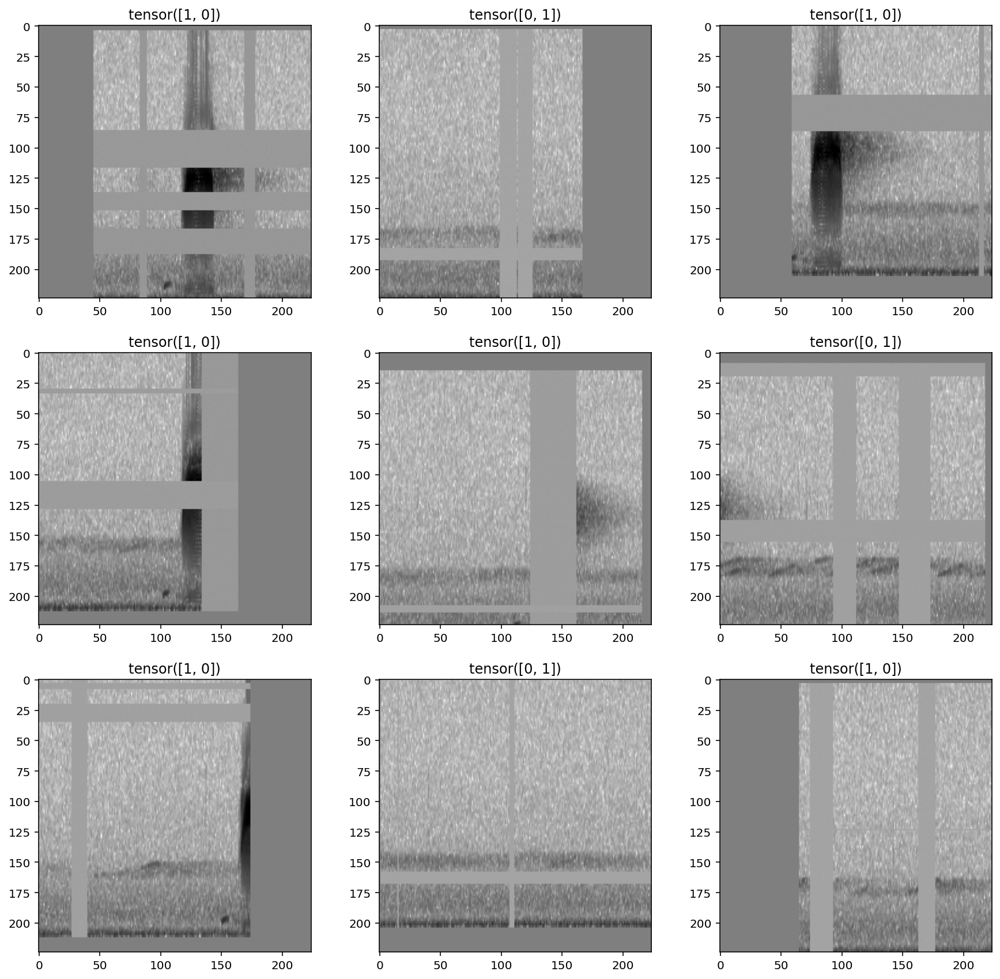

In [53]:
from opensoundscape.preprocess.utils import show_tensor_grid

dataset = SpecPreprocessor(labels,sample_duration=2.0)

tensors = [dataset[i]['X'] for i in range(9)]
sample_labels = [dataset[i]['y'] for i in range(9)]

_ = show_tensor_grid(tensors,3,labels=sample_labels)


let's repeat the exercise of inspecting preprocessed samples, this time without augmentation

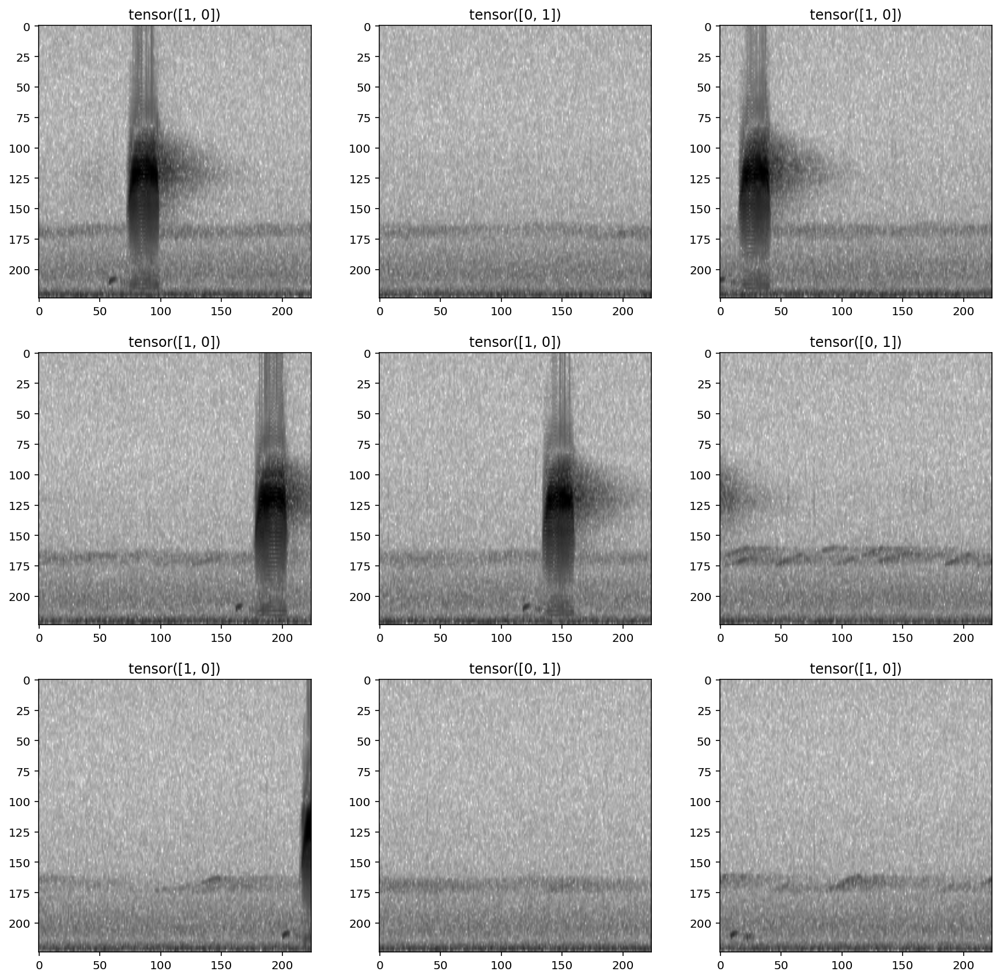

In [54]:
dataset.augmentation_on = False

tensors = [dataset[i]['X'] for i in range(9)]
sample_labels = [dataset[i]['y'] for i in range(9)]

_ = show_tensor_grid(tensors,3,labels=sample_labels)

#### DataLoaders and batch sizes 

during machine learning tasks with Pytorch, a `DataLoader` is often used on top of a Dataset to "batch" samples - that is, to prepare multiple samples at once. A batch returned by a DataLoader will have an extra leading dimension for both 'X' and 'y'; for instance, a `batch_size` of 16 would produce 'X' withs shape [16, 3, 224, 224] for 3-channel 224x224 tensors and 'y' with shape [16, 5] if the labels contain 5 classes (columns). OpenSoundscape uses DataLoaders internally to create batches of samples during CNN training and prediction. 

### Subset samples from a Preprocessor
Preprocessors allow you to select a subset of samples using `sample()` and `head()` methods (like Pandas DataFrames). 

(note that these methods subset files from the index, they do not subset individual clips from files) 

In [55]:
len(dataset)

29

Select the first 10 samples (non-random)

In [56]:
len(dataset.head(10))

10

Randomly select an absolute number of samples

In [57]:
len(dataset.sample(n=10))

10

Randomly select a fraction of samples

In [58]:
len(dataset.sample(frac=0.5))

14

## Pipelines and actions

Each Preprocessor class has a `pipeline` which is an ordered set of operations that are performed on each sample, in the form of a pandas.Series object. Each element of the series is an object of class Action (or one of its subclasses) and represents a transformation on the sample. 

### About Pipelines

The preprocessor's Pipeline is the ordered list of Actions that the preprocessor performs on each sample. 

* The Pipeline is stored in the `preprocessor.pipeline` attribute.

* You can modify the contents or order of Preprocessor Actions by overwriting the preprocessor's `.pipeline` attribute. When you modify this attribute, you must provide pd.Series with elements name:Action, where each Action is an instance of a class that sub-classes `opensoundscape.preprocess.BaseAction`.

Let's Inspect the current pipeline of our preprocessor.

In [59]:
# inspect the current pipeline (ordered sequence of Actions to take)
preprocessor = SpecPreprocessor(label_df=pd.DataFrame(),sample_duration=2)
preprocessor.pipeline

/Users/SML161/opensoundscape/opensoundscape/preprocess/preprocessors.py:51: UserWarning: return_labels=True but df has no columns!
  warnings.warn("return_labels=True but df has no columns!")
/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x7ff77...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_img               Action calling <function Spectrogram.to_image ...
time_mask            Augmentation Action calling <function time_mas...
frequency_mask       Augmentation Action calling <function frequenc...
add_noise            Augmentation Action calling <function tensor_a...
rescale              Action calling <function scale_tensor at 0x7ff...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

### About actions

Each element of the preprocessor's `pipeline` (a pd.Series) contains a name (string) and an action (Action)

* Each Action takes a sample (and its labels), performs some transformation to them, and returns the sample (and its labels).

* You can generate an Action based on a function like this : Action(fn=my_function, other parameters...). The function you pass (`my_function` in this case) must expect the sample as the first argument. It can then take additional parameters. For instance, if we define the function:

    ```
    def multiply(x,n):
        return x*n
    ```
    
    then we can create an action to multiply by 3 with `action=Action(fn=multiply,n=3)`

* Any customizable parameters for performing the Action are stored in a dictionary, `.params`. These parameters can be modified directly (e.g. `Action.params.param1=value1`) or using the Action's `.set()` method (e.g. `action.set(param=value, param2=value2, ...)` )

* You can bypass an action in a pipeline by changing `Action.bypass` to `True`

* You can declare whether an Action is an augmentation (should only be performed if augmentation_on==True) using its `.is_augmentation` boolean attribute



## Modifying Actions

### View default parameters for an Action
the `.params` attribute of an Action is a pandas Series containing parameters that can be modified

In [60]:
#since the pipeline is a series, we can access elements like pipeline.to_spec as well as pipeline['to_spec']
preprocessor.pipeline.to_spec.params

window_type                 hann
window_samples              None
window_length_sec           None
overlap_samples             None
overlap_fraction            None
fft_size                    None
decibel_limits       (-100, -20)
dB_scale                    True
dtype: object

### Modify Action parameters

we can modify parameters with the Action's .set() method:

In [61]:
preprocessor.pipeline.to_spec.set(dB_scale=False)

or by accessing the parameter directly (params is a pandas Series)

In [62]:
preprocessor.pipeline.to_spec.params.window_samples = 512
preprocessor.pipeline.to_spec.params['overlap_fraction'] = 0.75

preprocessor.pipeline.to_spec.params

window_type                 hann
window_samples               512
window_length_sec           None
overlap_samples             None
overlap_fraction            0.75
fft_size                    None
decibel_limits       (-100, -20)
dB_scale                   False
dtype: object

### Bypass actions
Actions can be bypassed by changing the attribute `.bypass=True`. A bypassed action is never performed regardless of the `.perform_augmentations` attribute. 

In [63]:
preprocessor = SpecPreprocessor(pd.DataFrame(),sample_duration=2.0)

#turn off augmentations other than noise
preprocessor.pipeline.add_noise.bypass=True
preprocessor.pipeline.time_mask.bypass=True
preprocessor.pipeline.frequency_mask.bypass=True

#printing the pipeline will show which actions are bypassed
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x7ff77...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_img               Action calling <function Spectrogram.to_image ...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
add_noise            ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x7ff...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

create a dataset: a copy of the preprocessor containing a list of samples

random affine off


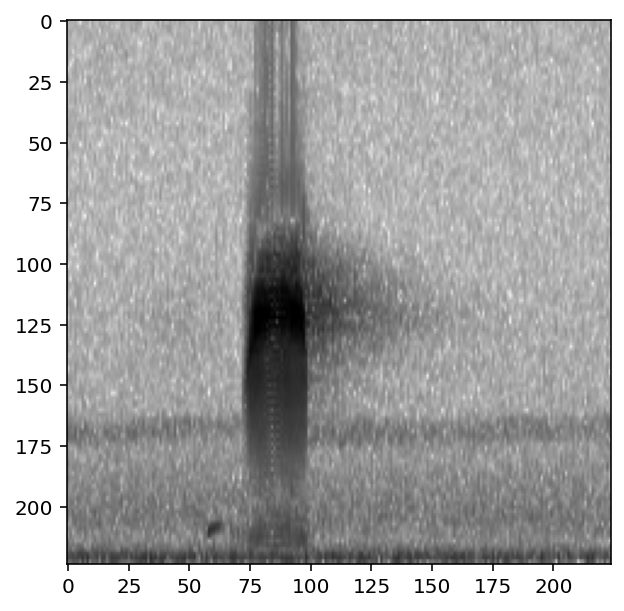

random affine on


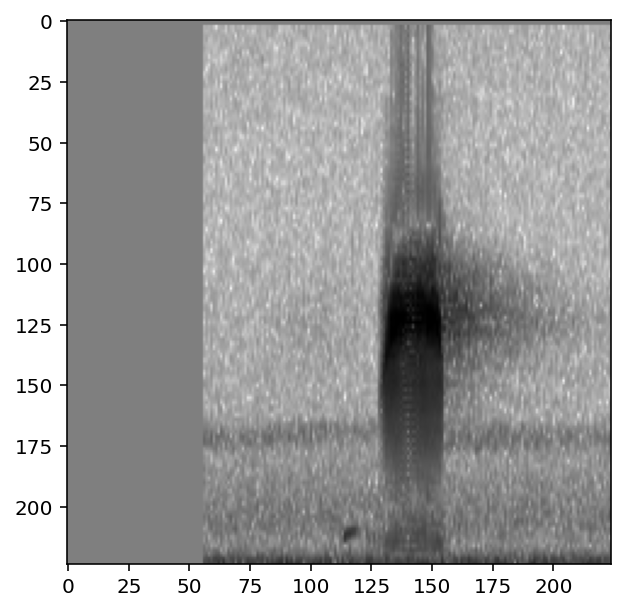

In [64]:
dataset = preprocessor.make_dataset(labels)

print('random affine off')
preprocessor.pipeline.random_affine.bypass = True
show_tensor(dataset[0]['X'],invert=True,transform_from_zero_centered=True)
plt.show()

print('random affine on')
preprocessor.pipeline.random_affine.bypass = False
show_tensor(dataset[0]['X'],invert=True,transform_from_zero_centered=True)

To view whether an individual Action in a pipeline is on or off, inspect its `bypass` attribute:

In [65]:
# The AudioLoader Action that is still on
preprocessor.pipeline.load_audio.bypass

False

In [66]:
# The frequency_mask Action that we turned off
preprocessor.pipeline.frequency_mask.bypass

True

## Modifying the pipeline
Sometimes, you may want to change the order or composition of the Preprocessor's pipeline. You can simply overwrite the `.pipeline` attribute, as long as it is a pandas Series of names:Actions

### Example: return Spectrogram instead of Tensor
Here's an example where we replace the pipeline with one that just loads audio and converts it to a Spectrogram, returning a Spectrogram instead of a Tensor:

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


original pipeline:
Action calling <bound method Audio.from_file of <class 'opensoundscape.audio.Audio'>>
Augmentation Action calling <function trim_audio at 0x7ff77362d940>
Action calling <function trim_audio at 0x7ff77362d940>
Action calling <bound method Spectrogram.from_audio of <class 'opensoundscape.spectrogram.Spectrogram'>>
Action calling <function Spectrogram.bandpass at 0x7ff7702353a0>
Action calling <function Spectrogram.to_image at 0x7ff770235670>
Augmentation Action calling <function time_mask at 0x7ff77363f5e0>
Augmentation Action calling <function frequency_mask at 0x7ff77363f670>
Augmentation Action calling <function tensor_add_noise at 0x7ff77363f700>
Action calling <function scale_tensor at 0x7ff77363f550>
Augmentation Action calling <function torch_random_affine at 0x7ff77363f430>

new pipeline:
Action calling <bound method Audio.from_file of <class 'opensoundscape.audio.Audio'>>
Augmentation Action calling <function trim_audio at 0x7ff77362d940>
Action calling <funct

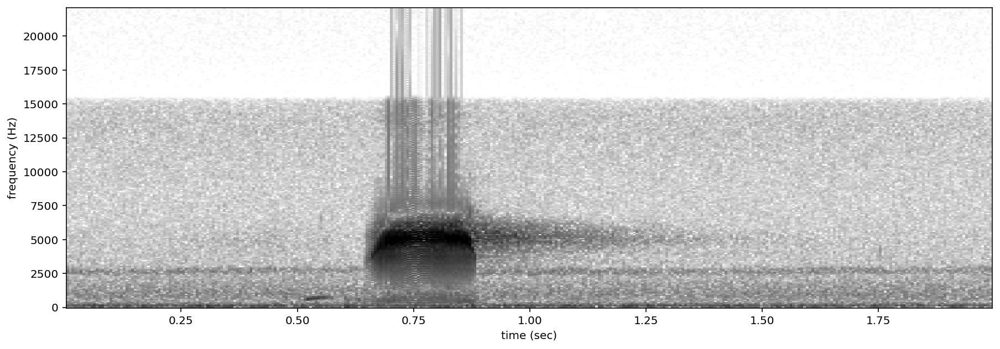

In [67]:
#initialize a preprocessor 
dataset = SpecPreprocessor(labels,2.0)
print('original pipeline:')
[print(p) for p in dataset.pipeline]

#overwrite the pipeline with a slice of the original pipeline
print('\nnew pipeline:')
dataset.pipeline = dataset.pipeline[0:4]
[print(p) for p in dataset.pipeline]

print('\nWe now have a preprocessor that returns Spectrograms instead of Tensors:')
print(f"Type of returned sample: {type(dataset[0]['X'])}")
dataset[0]['X'].plot()

## Customizing preprocessing to achieve better machine learning outcomes

The right choice of preprocessing depends heavily on the characteristics of the sounds you wish to study. The best way to tune preprocessing parameters is to visually inspect samples created by your preprocessing procedure and tweak parameters to achieve visual clarity of the sounds of interest in your samples. We find these heuristics to be a good starting point:

- The duration of a sample should be approximately 2-5x the duration of the target sound. For instance, a very short nocturnal flight call lasting 0.1 seconds might be best visualized with a 0.3 second sample_duration. Meahwhile, a 10-second bout of ruffed grouse drumming might deserve a 20 second sample_duartion. 

- The frequency range of a sample should be wider than the target sound, but not by more than 1 order of magnitude. For instance, sounds that are low-pitched will be more clearly visualized when bandpassing a spectrogram to the low frequencies. If you use a 0-10,000 Hz spectrogram for a 500 Hz target sound, your target sound will only occupy a small fraction of your sample. 

- Spectrogram parameters should be matched to the temporal or spectral features of the target sound. Modify the Spectorgram's window_samples to achieve high enough time resolution (lower value of window_samples) or frequency resolution (higher value of window_samples) to see features of your target sound clearly on the resulting sample. For example, a rapid trill with a pulse repetition rate of 50 Hz will only be distinctive on a spectrogram if the Spectrogram windows are less than `1/(50*2) = 0.01` seconds in duration. On the other hand, visualizing a distinctive harmonic "ladder" structure of a nasal sound might require long spectrogram windows which will increase frequency resolution.

Augmentations are Actions that are only performed during training, not during prediction. These actions manipulate the sample in some randomized way, so that each time the same sample is provided to the model as training data, the actual values of the sample are different. This prevents over-training of a model on a training set and effectively increases the size of a training dataset. In general, you can expect that a basic set of augmentations (such as those included by default in the SpecPreprocessor and CNN classes) will be necessary to train a useful machine learning model. In particular, "overlay" augmentations which blend together multiple samples often increase the generalizability (transferability) of a model. You might choose to use audio from your target system (for instance, field recordings at your study site) to make the training data look more similar to the data that the model will be applied to. 

Below are various examples of how to modify parameters of the Actions to achieve different preprocessing outcomes. 

### Modify the sample rate 
Resample all loaded audio to a specified rate during the load_audio action

In [68]:
dataset = SpecPreprocessor(labels,sample_duration=2)

dataset.pipeline.load_audio.set(sample_rate=24000)

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


### Modify spectrogram window length and overlap
(see Spectrogram.from_audio() for detailed documentation)

maybe Pipeline should be a class that subclasses pandas Series, and has .forward() method (replacing run_pipeline)

default parameters:


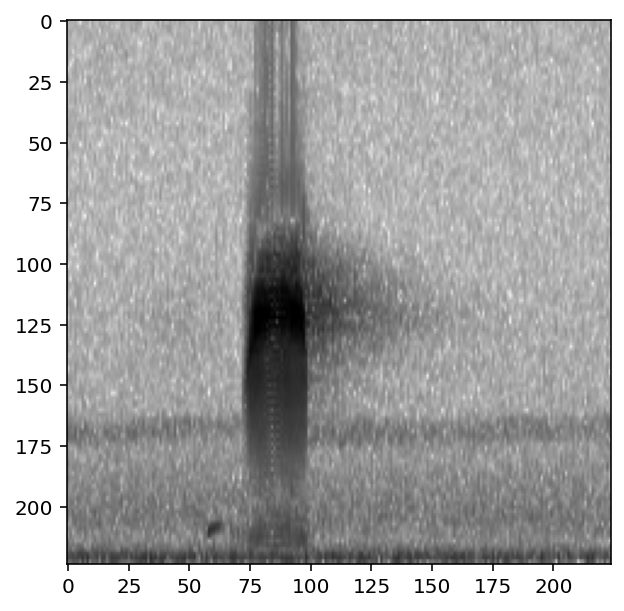

high time resolution, low frequency resolution:


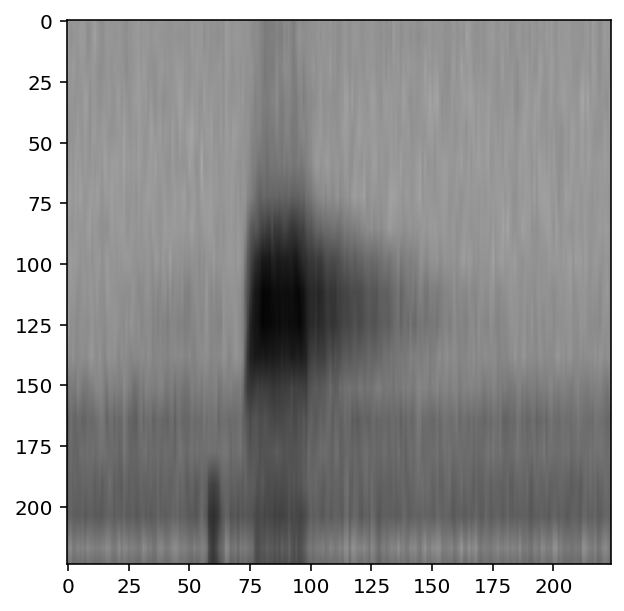

In [69]:
dataset = SpecPreprocessor(labels,sample_duration=2)
dataset.augmentation_on = False

print('default parameters:')
show_tensor(dataset[0]['X'],invert=True,transform_from_zero_centered=True)
plt.show()

print('high time resolution, low frequency resolution:')
dataset.pipeline.to_spec.set(window_samples=64)

show_tensor(dataset[0]['X'],invert=True,transform_from_zero_centered=True)

### Bandpass spectrograms
Trim spectrograms to a specified frequency range:

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


default parameters:
bandpassed to 2-4 kHz:


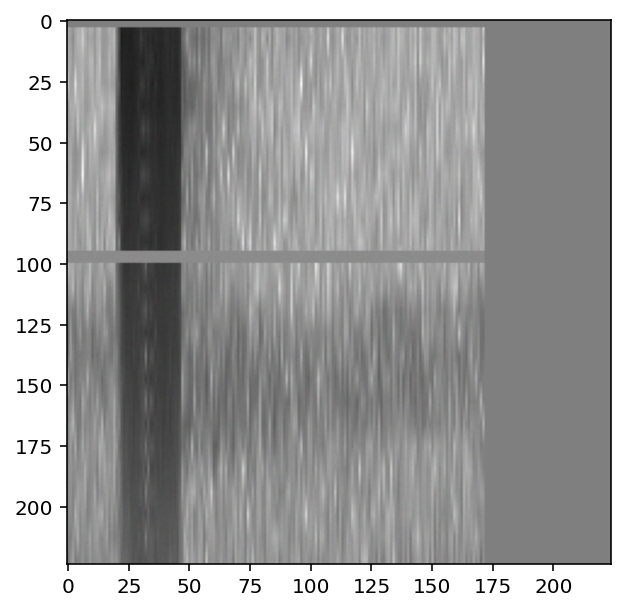

In [70]:
preprocessor = SpecPreprocessor(labels,2.0)

print('default parameters:')
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

print('bandpassed to 2-4 kHz:')
preprocessor.pipeline.bandpass.set(min_f=2000,max_f=4000)
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

### Change the output shape

Change the shape of the output sample 
- note that the shape argument expects (height, width), not (width, height) 

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


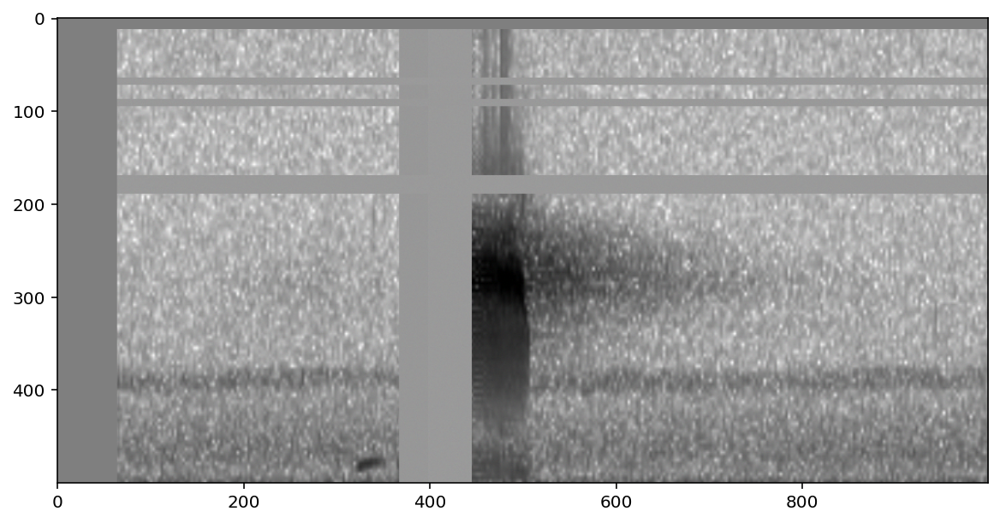

In [71]:
preprocessor = SpecPreprocessor(labels,2.0)
preprocessor.pipeline.to_img.set(shape=[500,1000])
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

### Turn all augmentation on or off
augmentation is controlled by the `preprocessor.augmentation_on` boolean (aka True/False) variable. A CNN will internally manipulate this attribute to perform augmentations during training but not during validation or prediction.

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


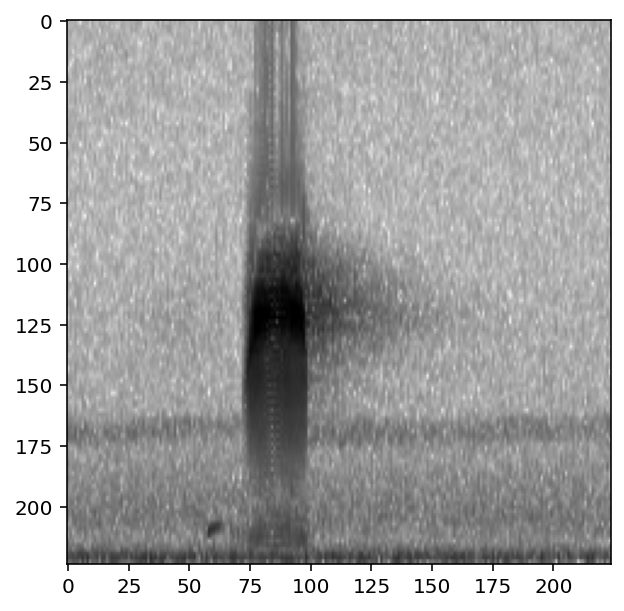

In [72]:
preprocessor = SpecPreprocessor(labels,2.0)

preprocessor.augmentation_on = False
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


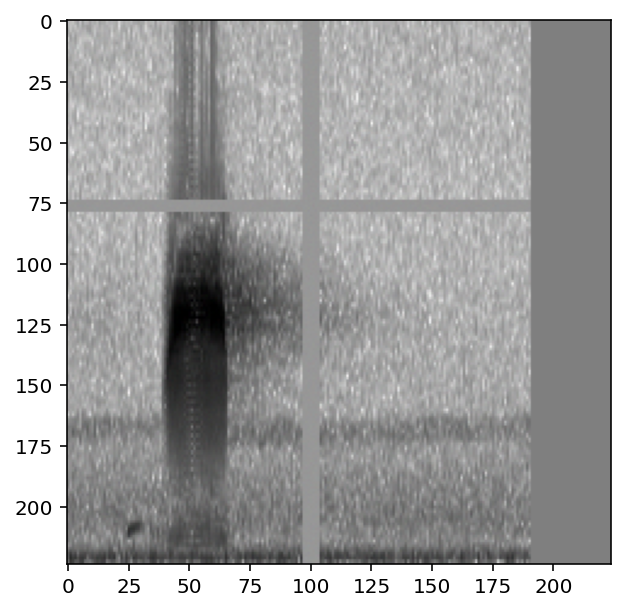

In [73]:
preprocessor.augmentation_on = True
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

### Modify augmentation parameters
`SpecPreprocessor` includes several augmentations with customizable parameters. Here we provide a couple of illustrative examples - see any action's documentation for details on how to use its parameters. 

In [111]:
pd.Series?

Init signature:
pd.Series(
    data=None,
    index=None,
    dtype: 'Dtype | None' = None,
    name=None,
    copy: 'bool' = False,
    fastpath: 'bool' = False,
)
Docstring:     
One-dimensional ndarray with axis labels (including time series).

Labels need not be unique but must be a hashable type. The object
supports both integer- and label-based indexing and provides a host of
methods for performing operations involving the index. Statistical
methods from ndarray have been overridden to automatically exclude
missing data (currently represented as NaN).

Operations between Series (+, -, /, *, **) align values based on their
associated index values-- they need not be the same length. The result
index will be the sorted union of the two indexes.

Parameters
----------
data : array-like, Iterable, dict, or scalar value
    Contains data stored in Series. If data is a dict, argument order is
    maintained.
index : array-like or Index (1d)
    Values must be hashable and have the same 

In [74]:
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x7ff77...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_img               Action calling <function Spectrogram.to_image ...
time_mask            Augmentation Action calling <function time_mas...
frequency_mask       Augmentation Action calling <function frequenc...
add_noise            Augmentation Action calling <function tensor_a...
rescale              Action calling <function scale_tensor at 0x7ff...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


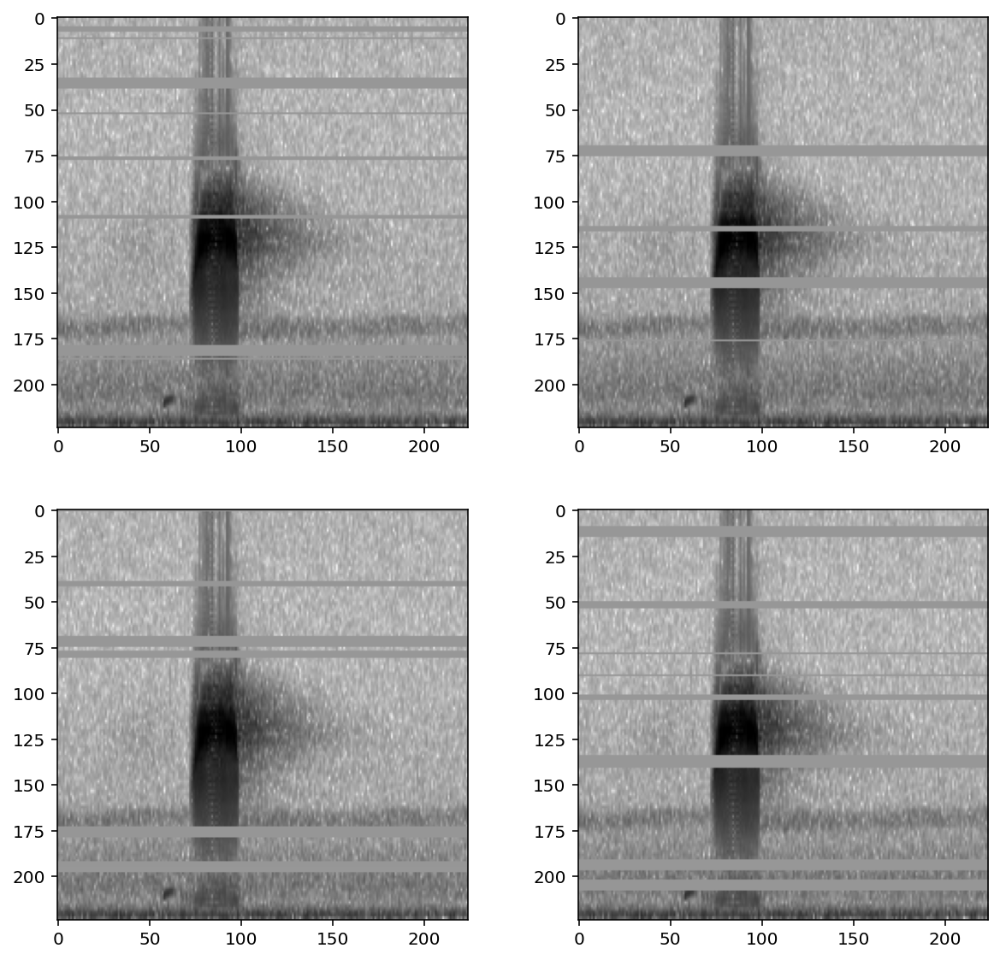

In [75]:
#initialize a preprocessor
preprocessor = SpecPreprocessor(labels,2.0)

#turn off augmentations other than overlay
preprocessor.pipeline.random_affine.bypass=True
preprocessor.pipeline.time_mask.bypass=True
preprocessor.pipeline.add_noise.bypass=True

# allow up to 20 horizontal masks, each spanning up to 0.1x the height of the image. 
preprocessor.pipeline.frequency_mask.set(max_width = 0.03, max_masks=20)

#preprocess the same sample 4 times
tensors = [preprocessor[0]['X'] for i in range(4)]
fig = show_tensor_grid(tensors,2)
plt.show()

turn off frequency mask and turn on gaussian noise

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


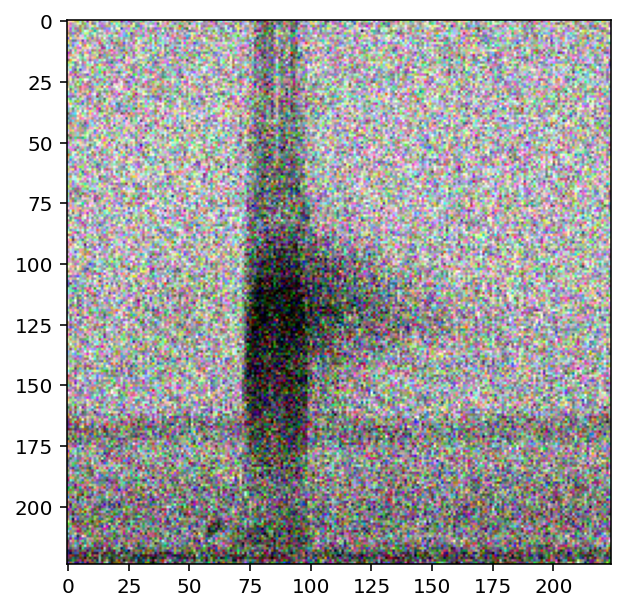

In [76]:
preprocessor.pipeline.add_noise.bypass = False
preprocessor.pipeline.frequency_mask.bypass =True

# increase the intensity of gaussian noise added to the image
preprocessor.pipeline.add_noise.set(std=0.2)
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

### remove an action by its name

In [77]:
preprocessor.remove_action('add_noise')
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x7ff77...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_img               Action calling <function Spectrogram.to_image ...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x7ff...
random_affine        ## Bypassed ## Augmentation Action calling <fu...
dtype: object

### add an action at a specific position
specify the action in the pipeline you want to insert before or after

In [78]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise

preprocessor.insert_action( 
    action_index='add_noise_NEW', #give it a name
    action=Action(tensor_add_noise,std=0.01), #the action object
    after_key='to_img', #where to put it (can also use before_key=...)
)

In [79]:
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x7ff77...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_img               Action calling <function Spectrogram.to_image ...
add_noise_NEW        Action calling <function tensor_add_noise at 0...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x7ff...
random_affine        ## Bypassed ## Augmentation Action calling <fu...
dtype: object

it will complain if you use a non-unique index

In [80]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise
import pytest

with pytest.raises(AssertionError): #make sure it raises an error, and catch it
    preprocessor.insert_action(
        action_index='add_noise_NEW', #using the same name as a currentaction will lead to an AssertionError
        action=Action(tensor_add_noise,std=0.01), #the action object
        after_key='to_img', #where to put it (can also use before_key=...)
    )

### Overlay augmentation
Overlay is a powerful Action that allows additional samples to be overlayed or blended with the original sample. 

The additional samples are chosen from the `overlay_df` that is provided to the preprocessor when it is initialized. The index of the `overlay_df` must be paths to audio files. The dataframe can be simply an index containing audio files with no other columns, or it can have the same columns as the sample dataframe for the preprocessor.

Samples for overlays are chosen based on their class labels, according to the parameter `overlay_class`:

- `None` - Randomly select any file from `overlay_df`
- `"different"` - Select a random file from `overlay_df` containing none of the classes this file contains
- specific class name - always choose files from this class

Samples can be drawn from dataframes in a few general ways (each is demonstrated below):

1. Using a separate dataframe where any sample can be overlayed (`overlay_class=None`)
2. Using the same dataframe as training, where the overlay class is "different," i.e., does not contain overlapping labels with the original sample
3. Using the same dataframe as training, where samples from a specific class are used for overlays

By default, the overlay Action does **not** change the labels of the sample it modifies. However, if you wish to add the labels from overlayed samples to the original sample's labels, you can set `update_labels=True` (see example below).

In [81]:
#initialize a preprocessor and provide a dataframe with samples to use as overlays
preprocessor = SpecPreprocessor(labels, 2.0, overlay_df=labels)

#remove augmentations other than overlay
for name in ['random_affine','time_mask','frequency_mask','add_noise']:
    preprocessor.remove_action(name)

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


#### Modify `overlay_weight`
Let's change `overlay_weight` to 

To demonstrate this, let's show what happens if we overlay samples from the "negative" class, resulting in the final sample having a higher or lower signal-to-noise ratio. By default, the overlay Action chooses a random file from the overlay dataframe. Instead, choose a sample from the class called `"present"` using the `overlay_class` parameter. 

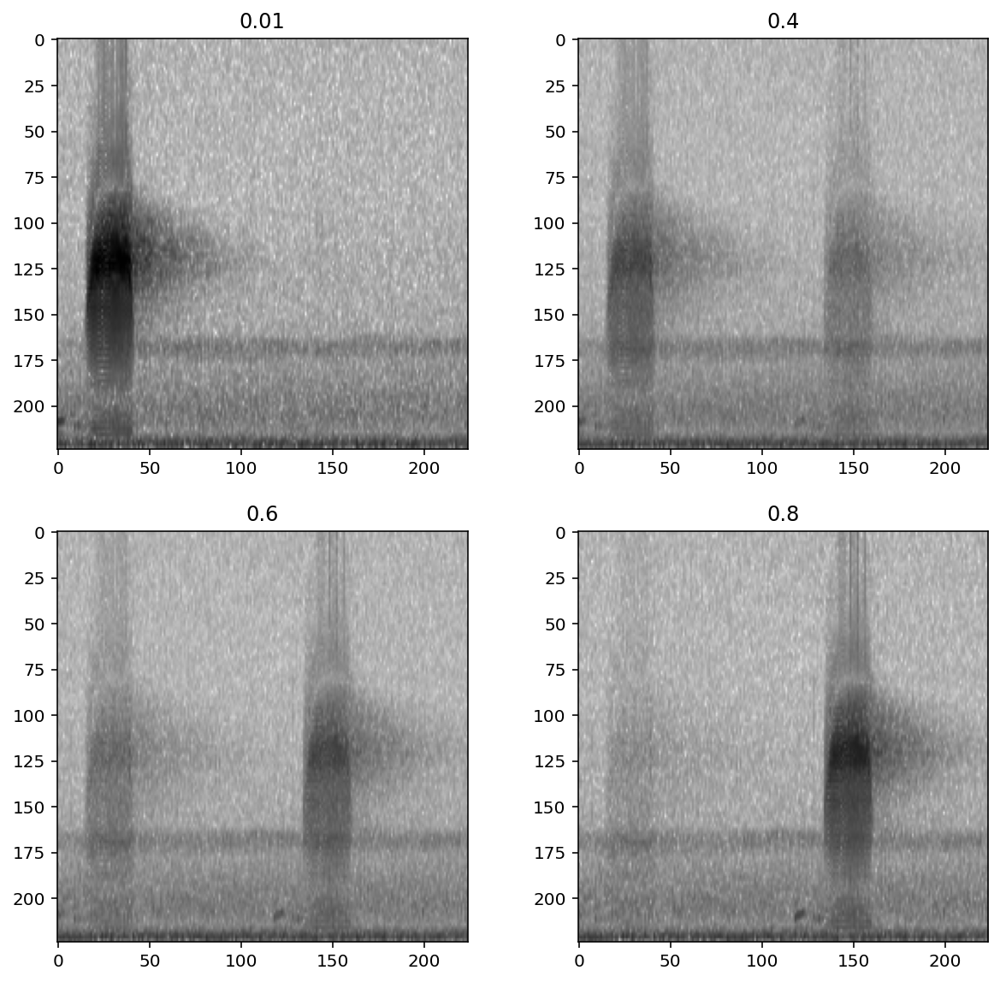

In [82]:
preprocessor.pipeline.overlay.set(overlay_class='present')
tensors = []
overlay_weights = [0.01, 0.4, 0.6, 0.8]
for w in overlay_weights:
    preprocessor.pipeline.overlay.set(overlay_weight=w)
    np.random.seed(0) #get the same overlay every time
    tensors.append(preprocessor[2]['X'])
_ = show_tensor_grid(tensors, 2, labels=overlay_weights)

#### Overlay samples from a specific class

As demonstrated above, you can choose a specific class to choose samples from. Here, instead, we choose samples from the "absent" class.

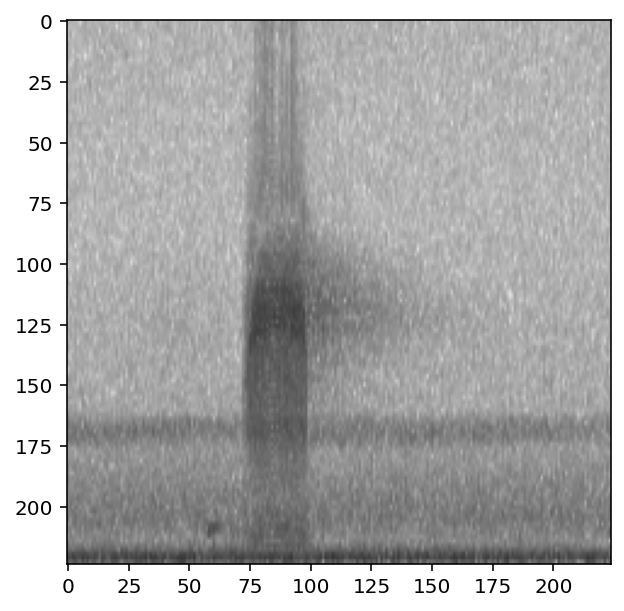

In [84]:
preprocessor.pipeline.overlay.set(
    overlay_class='absent',
    overlay_weight=0.4
)
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

#### Overlaying samples from any class
By default, or by specifying `overlay_class=None`, the overlay sample is chosen randomly from the overlay_df with no restrictions.

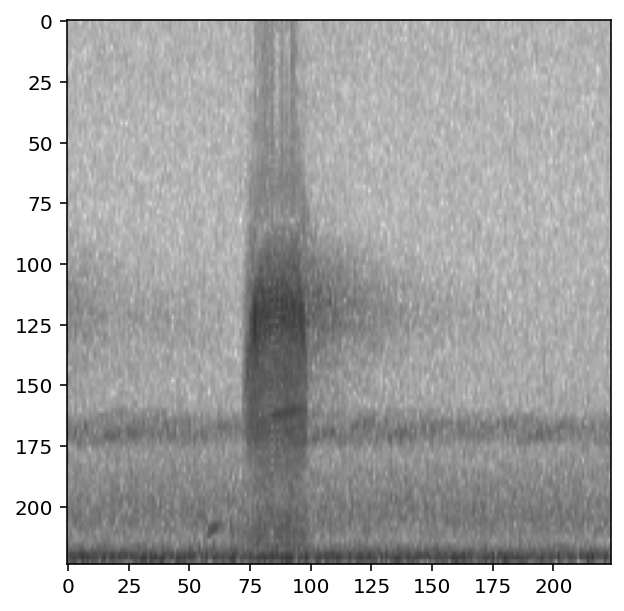

In [85]:
preprocessor.pipeline.overlay.set(overlay_class=None)
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

#### Overlaying samples from a "different" class
The `'different'` option for `overlay_class` chooses a sample to overlay that has non-overlapping labels with the original sample. 

In the case of this example, this has the same effect as drawing samples from the `"negative"` class a demonstrated above. In multi-class examples, this would draw from any of the samples not labeled with the class(es) of the original sample.

We'll again use `overlay_weight=0.8` to exaggerate the importance of the overlayed sample (80%) compared to the original sample (20%). 

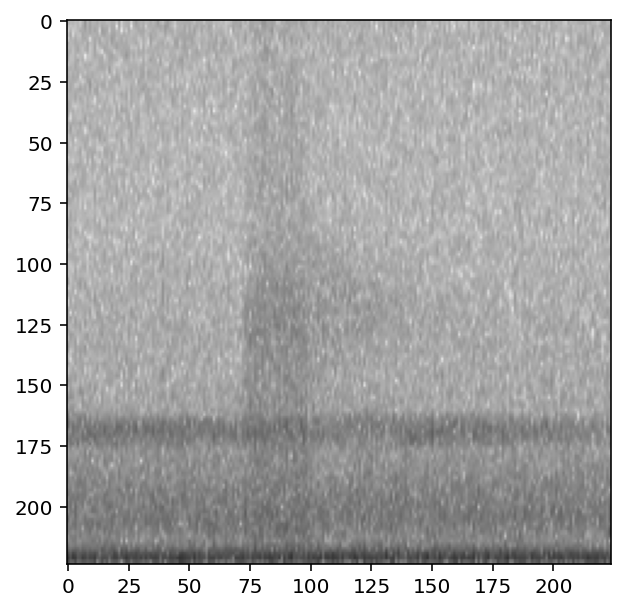

In [86]:
preprocessor.pipeline.overlay.set(update_labels=False,overlay_class='different',overlay_weight=0.8)
show_tensor(preprocessor[0]['X'],invert=True,transform_from_zero_centered=True)

#### Updating labels 
By default, the overlay Action does **not** change the labels of the sample it modifies. 

For instance, if the overlayed sample has labels [1,0] and the original sample has labels [0,1], the default behavior will return a sample with labels [0,1] not [1,1]. 

If you wish to add the labels from overlayed samples to the original sample's labels, you can set `update_labels=True`. 

In [87]:
print('default: labels do not update')
preprocessor.pipeline.overlay.set(update_labels=False,overlay_class='different')
print(f"\t resulting labels: {preprocessor[0]['y'].numpy()}")

print('Using update_labels=True')
preprocessor.pipeline.overlay.set(update_labels=True,overlay_class='different')
print(f"\t resulting labels: {preprocessor[0]['y'].numpy()}")


default: labels do not update
	 resulting labels: [1 0]
Using update_labels=True
	 resulting labels: [1 1]


This example is a single-target problem: the two classes represent "woodcock absent" and "woodcock present." Because the labels are mutually exclusive, labels [1,1] do not make sense. So, for this single-target problem, we would __not__ want to use `update_labels=True`, and it would probably make most sense to only overlay absent recordings, e.g., `overlay_class='absent'`.

## Creating a new Preprocessor class
If you have a specific augmentation routine you want to perform, you may want to create your own Preprocessor class rather than modifying an existing one. 


Your subclass might add a different set of Actions, define a different pipeline, or even override the `__getitem__` method of BasePreprocessor. 

Here's an example of a customized preprocessor that subclasses `AudioToSpectrogramPreprocessor` and creates a pipeline that depends on the `magic_parameter` input. 

In [106]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise
class MyPreprocessor(SpecPreprocessor):
    """Child of AudioToSpectrogramPreprocessor with weird augmentation routine"""
    
    def __init__(
        self,
        df,
        magic_parameter,
        sample_duration,
        return_labels=True,
        out_shape=[224, 224,1],
    ):

        super(MyPreprocessor, self).__init__(
            df,
            sample_duration=sample_duration,
            out_shape=out_shape,
            return_labels=return_labels,
        )

        for i in range(magic_parameter):
            action = Action(tensor_add_noise, std=0.1*magic_parameter)
            self.insert_action(f'noise_{i}',action)

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


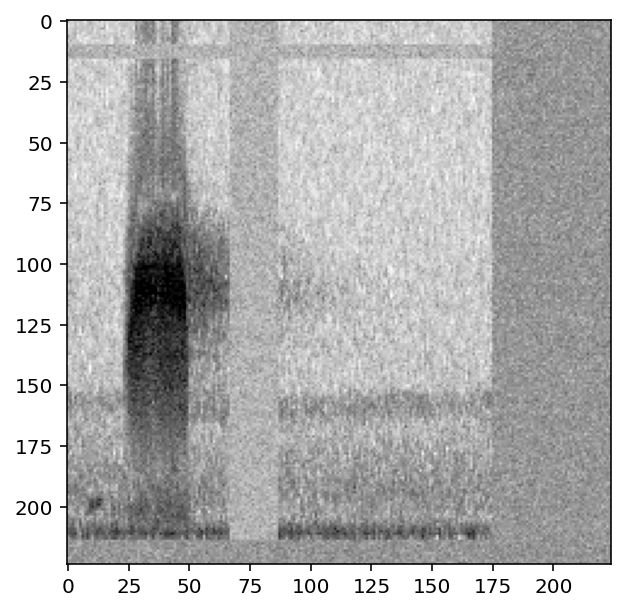

In [107]:
p = MyPreprocessor(labels, sample_duration=2.0, magic_parameter=1)
show_tensor(p[0]['X'],invert=False,transform_from_zero_centered=True)

/Users/SML161/opt/miniconda3/envs/opso_dev/lib/python3.8/site-packages/pandas/core/series.py:3247: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  other = Series(other)


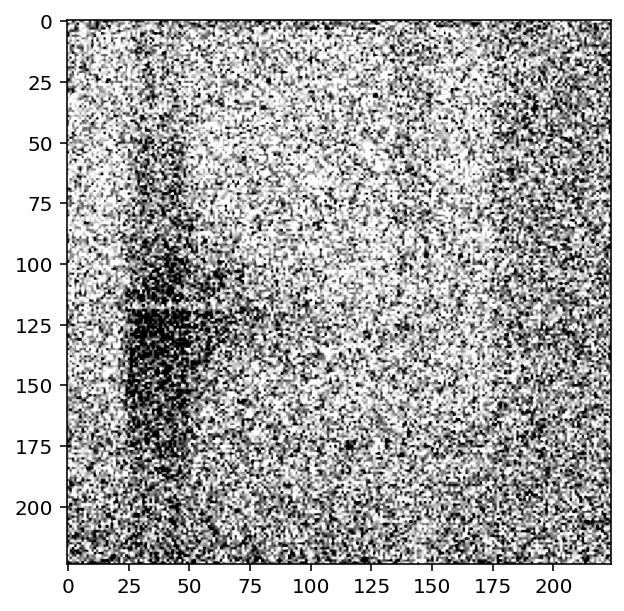

In [109]:
p = MyPreprocessor(labels, sample_duration=2.0, magic_parameter=4)
show_tensor(p[0]['X'],invert=False,transform_from_zero_centered=True)

## Defining new Actions
You can usually define a new action simply by passing a method to Action(). However, you can also write a subclass of Action for more advanced use cases - this is necessary if the action needs inputs other than the sample, such as labels. 

### using additional input in an Action

The following additional variables can be requested by an action, and will be passed from the pipeline when the action is run:
```
    "_path": audio file path
    "_labels": row of pd.DataFrame with 0/1 labels for each class (pd.Series)
    "_start_time": start time of clip within longer audio file, if splitting long files into clips during preprocessing
    "_sample_duration": sample_duration of clip in seconds
    "_pipeline": a copy of the preprocessor's pipeline itself
```

In [46]:
from opensoundscape.preprocess.actions import Action

def my_action_fn(x, _labels,threshold=0.1):
    if _labels[0]==1:
        samples = np.array([0 if np.abs(s)<threshold else s for s in audio.samples])
        x = Audio(samples, audio.sample_rate)
    return x

class AudioGate(Action):
    """Replace audio samples below a threshold with 0, but only if label[0]==1
    
    Audio in, Audio out
    
    Args: 
        threshold: sample values below this will become 0
    """

    def __init__(self, **kwargs):
        super(AudioGate, self).__init__(my_action_fn,extra_args=['_labels'],**kwargs)

Test it out:

histogram of samples


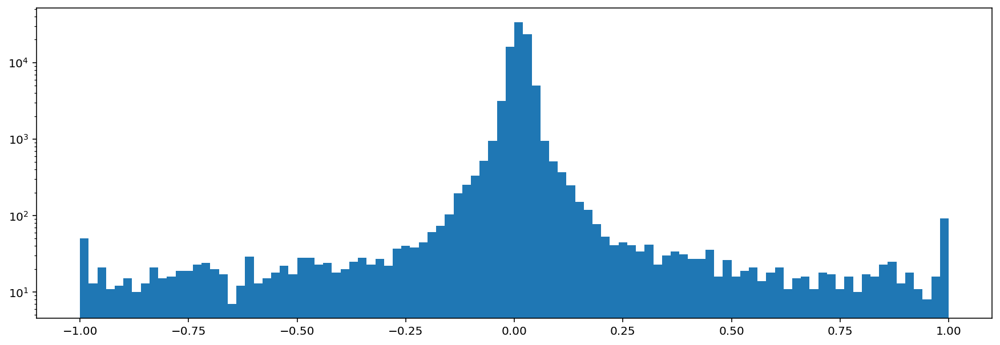

histogram of samples after audio gate


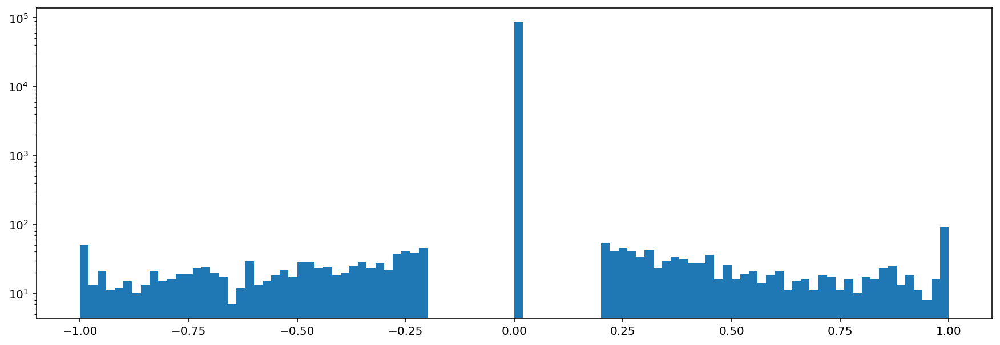

histogram of samples after audio gate, when labels[0]==0


[]

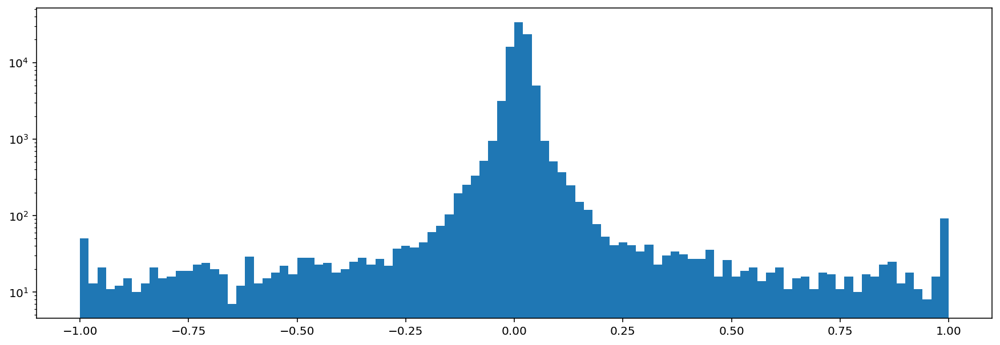

In [47]:
from opensoundscape.audio import Audio

gate_action = AudioGate(threshold=0.2)

print('histogram of samples')
audio = Audio.from_file('./woodcock_labeled_data/01c5d0c90bd4652f308fd9c73feb1bf5.wav')
_ = plt.hist(audio.samples,bins=100)
plt.semilogy()
plt.show()

print('histogram of samples after audio gate')
audio_gated = gate_action.go(audio,_labels={0:1,1:0})
_ = plt.hist(audio_gated.samples,bins=100)
plt.semilogy()
plt.show()

print('histogram of samples after audio gate, when labels[0]==0')
audio_gated = gate_action.go(audio,_labels={0:0,1:1})
_ = plt.hist(audio_gated.samples,bins=100)
plt.semilogy()

Clean up files created during this tutorial:

In [48]:
import shutil
shutil.rmtree('./woodcock_labeled_data')